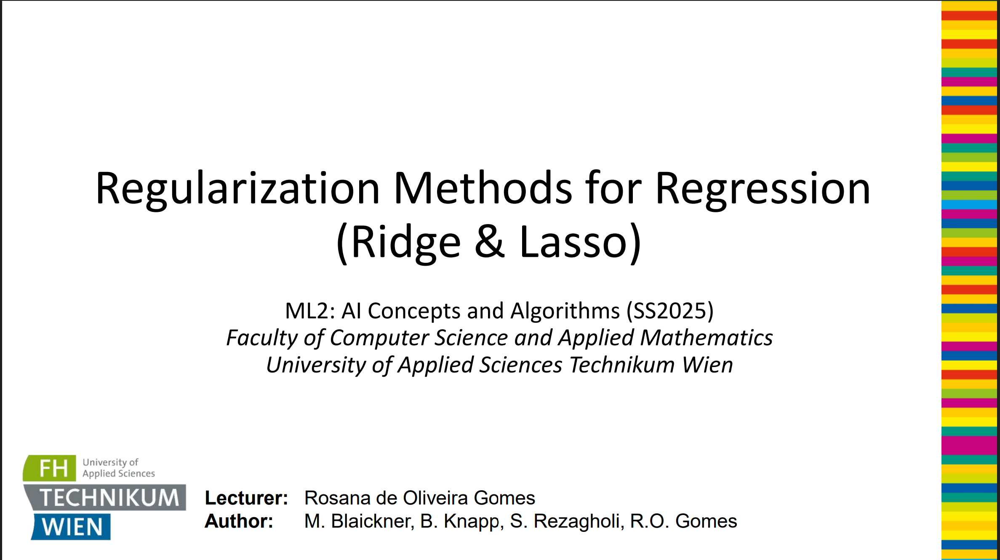


---

Welcome everyone.

This presentation will cover **Regularization Methods for Regression**, focusing on two key techniques: **Ridge Regression** and **Lasso Regression**.

These methods are crucial when dealing with **overfitting** in regression models — especially in situations with **many predictors**, **collinear features**, or when we want to **select relevant variables** automatically.

Throughout this session, we’ll:

* Understand the motivation behind regularization,
* See how Ridge and Lasso modify the loss function,
* Explore their mathematical formulations and use cases,
* And finally, compare them side-by-side and see how to tune them.

Let’s begin with the first content slide. Please proceed.


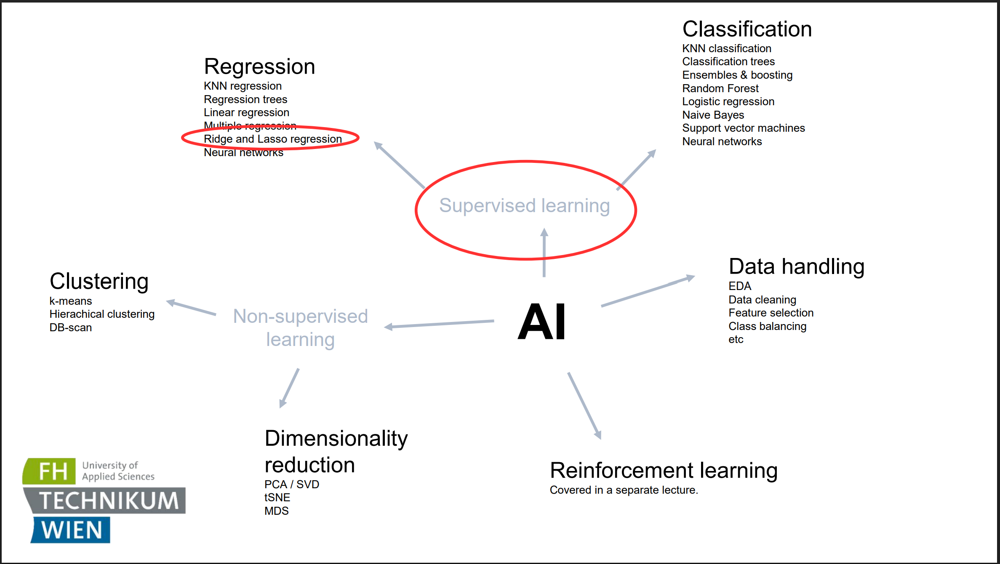

This slide presents the **big picture of AI subfields**, with our current focus circled:
**Ridge and Lasso Regression** under the **Regression** branch of **Supervised Learning**.

Let’s break this down:

---

### 🧠 At the center: **AI**

Artificial Intelligence encompasses multiple learning paradigms, of which:

### 🔵 Supervised Learning

> Data includes input-output pairs (labels). The goal is to learn a mapping from inputs to outputs.

Two main families:

* **Classification** (e.g. logistic regression, SVMs)
* **Regression** (e.g. linear regression, Ridge & Lasso)

Our current focus — **Ridge and Lasso regression** — is **supervised** and **regression-based**, aiming to **predict continuous outcomes** while managing **model complexity**.

---

### ⚪ Non-supervised Learning

* **Clustering** (e.g. k-means)
* **Dimensionality reduction** (e.g. PCA, t-SNE)

These methods don’t use output labels.

---

### ⚙ Data Handling

These are preprocessing techniques to clean, prepare, and balance datasets before feeding them into models.

---

### 🟣 Reinforcement Learning

Mentioned but **covered elsewhere** — it's about learning policies through reward signals.

---

### Key Takeaway:

We are zooming into **Regression within Supervised Learning**, tackling the core challenge of **overfitting** using **regularization** techniques.

Ready for the next slide.


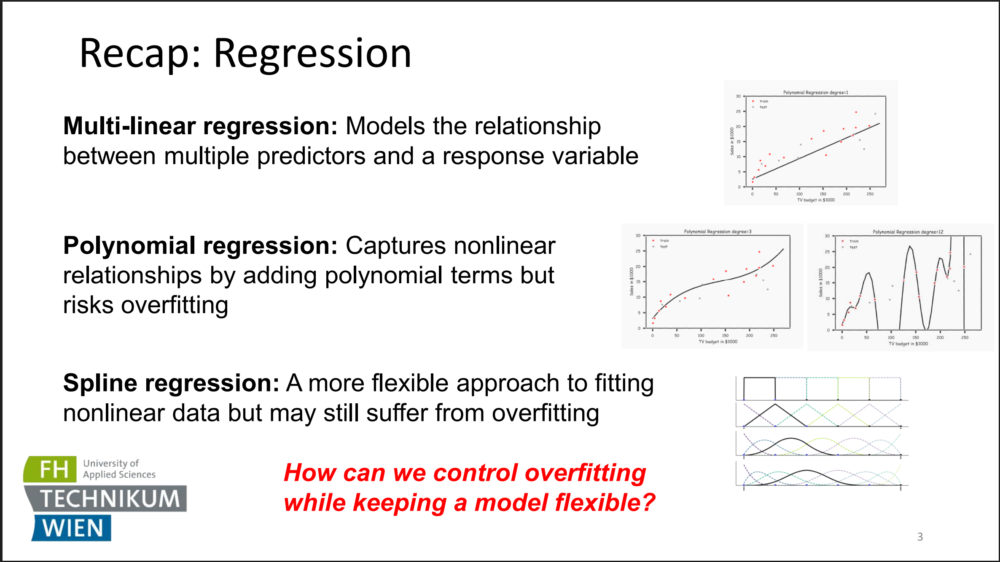

This slide is a **recap of regression methods** — reminding us why regularization is needed.

---

### 🧱 Multi-linear Regression

> Models the linear relationship between **multiple independent variables** (predictors) and a single **dependent variable** (response).
> It’s the baseline model — **simple**, but only captures **linear trends**.

---

### 📈 Polynomial Regression

> Captures **nonlinear** patterns by adding higher-degree terms (e.g. $x^2, x^3, \dots$).
> It offers more **flexibility** but comes with a **high risk of overfitting** — as clearly shown in the right-hand plots:

* Degree 1 → underfit
* Degree 3 → decent fit
* Degree 12 → overfit chaos (model memorizes the noise)

---

### 🔗 Spline Regression

> A compromise between flexibility and simplicity.
> Instead of one global polynomial, it stitches together **piecewise polynomials**, which can model local trends better.
> Still — without proper control — it **can also overfit**.

---

### ❗ Key Problem Posed:

> 🟥 **How can we control overfitting while keeping a model flexible?**

This is where **regularization** techniques like Ridge and Lasso step in — providing a way to constrain models to avoid complexity without fully giving up flexibility.

Ready when you are for the next.


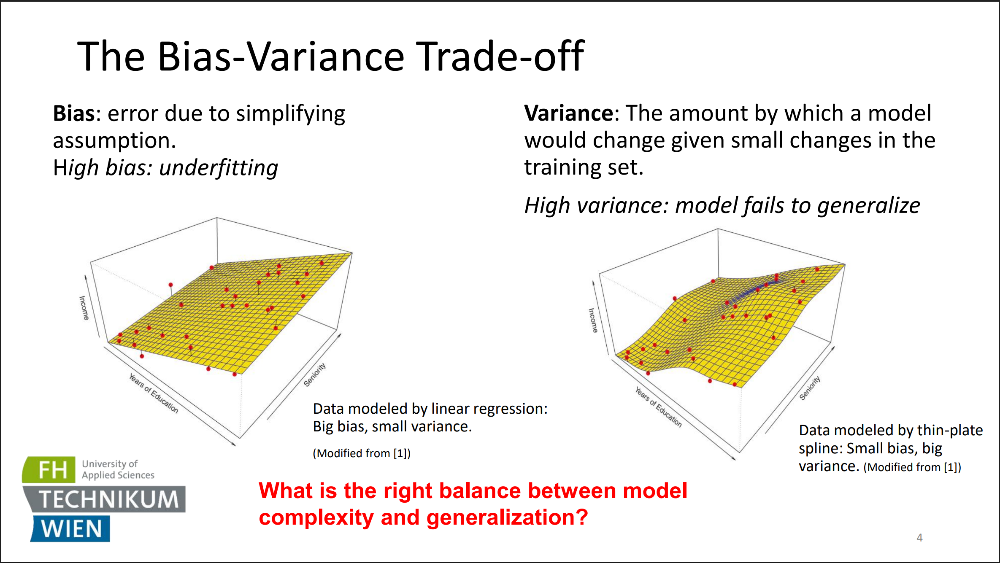

This slide introduces a foundational concept in statistical modeling and machine learning:

---

## 🎯 The Bias–Variance Trade-off

A critical challenge in supervised learning is **balancing two competing sources of error**:

---

### 🔷 **Bias** (left side)

* **Definition**: Error from overly simplistic assumptions in the model.
* **Effect**: The model **underfits** — it’s too rigid to capture the underlying patterns.
* **Example**: A flat plane (linear regression) trying to model complex relationships.
* **Characteristics**:

  * Low model complexity
  * Small variance (doesn’t change much across datasets)
  * High error due to systematic misrepresentation

---

### 🔶 **Variance** (right side)

* **Definition**: Error due to the model’s sensitivity to small fluctuations in the training data.
* **Effect**: The model **overfits** — it captures noise and loses generalization.
* **Example**: A wavy spline bending to every data point.
* **Characteristics**:

  * High model complexity
  * Captures training data very well
  * But performance collapses on new data

---

### ❓ The Core Dilemma:

> **"What is the right balance between model complexity and generalization?"**

This is exactly what **regularization** techniques like **Ridge** and **Lasso** aim to solve:

* By **penalizing model complexity**, they help reduce variance
* While accepting a **small increase in bias** for better overall performance

Next slide when you're ready.


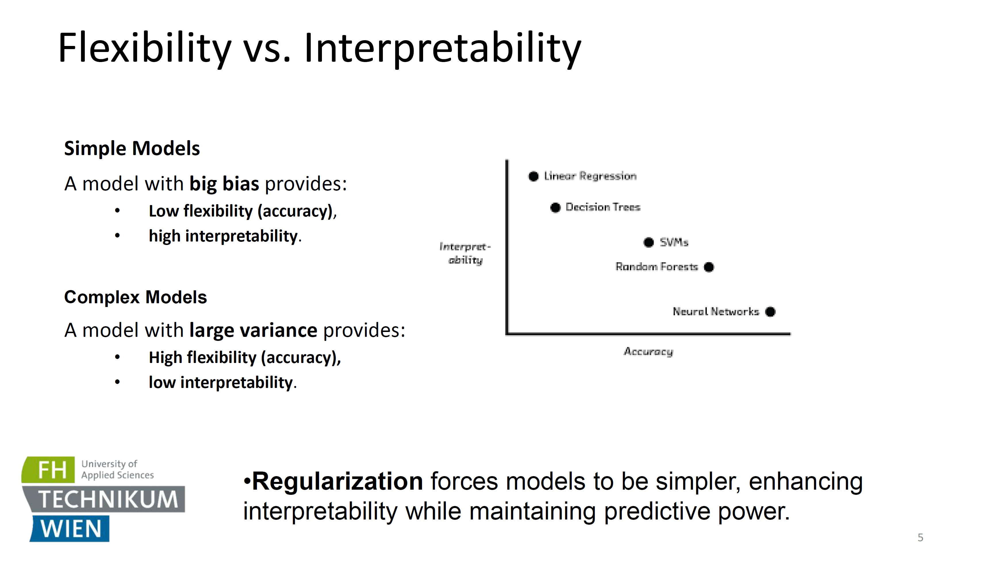

This slide builds on the **bias-variance trade-off** by connecting it to **model interpretability and flexibility**.

---

## ⚖️ Flexibility vs. Interpretability

There’s a tension between having a model that is:

* **Simple and easy to understand**
* vs.
* **Flexible and able to capture complex patterns**

---

### 🔹 Simple Models (High Bias)

* **Examples**: Linear regression, shallow decision trees
* **Pros**:

  * Easy to **explain** and **interpret**
  * Low risk of overfitting
* **Cons**:

  * Miss complex patterns → low **accuracy** (underfitting)

---

### 🔸 Complex Models (High Variance)

* **Examples**: Neural networks, ensemble methods
* **Pros**:

  * High **flexibility** → can fit intricate data
* **Cons**:

  * Often **black boxes**
  * Risk of overfitting if not controlled

---

### 📊 Diagram (top right)

Illustrates the trade-off:

* **Top-left**: Models like Linear Regression — very interpretable but not always accurate
* **Bottom-right**: Neural Networks — accurate but hard to interpret

---

### 🛠️ The Role of Regularization

> **Regularization** pushes complex models to be **simpler**, increasing **interpretability** without sacrificing too much predictive power.

This is the motivation behind Ridge and Lasso: add a **penalty** that keeps models in a sweet spot between **simplicity** and **performance**.

Ready to continue.


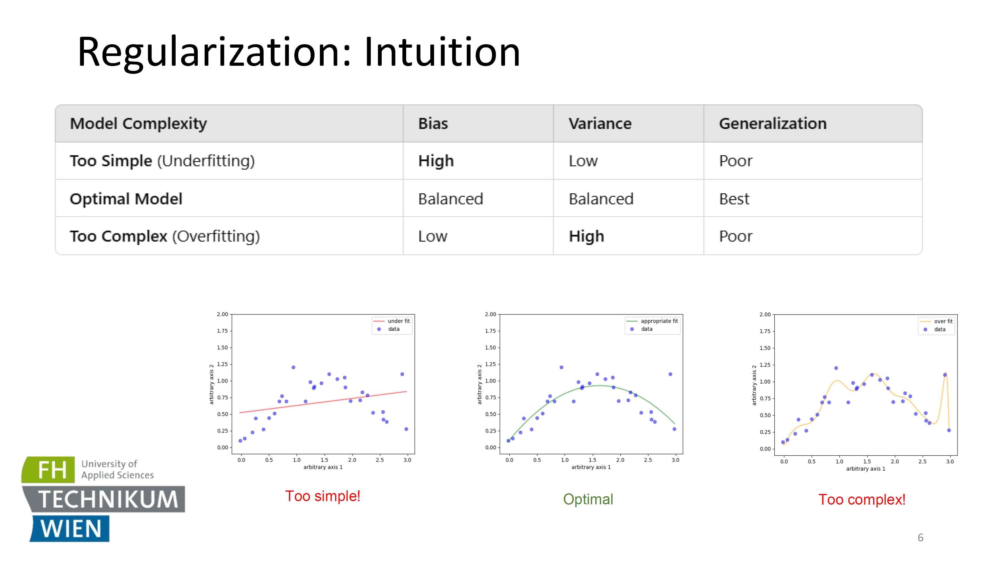

This slide is a visual and intuitive summary of what **regularization** is meant to control.

---

## 🔍 Regularization: Intuition

It ties back directly to the **bias-variance trade-off** and provides **three concrete scenarios**:

---

### 🟥 Too Simple → Underfitting

* **Bias**: High (model misses patterns)
* **Variance**: Low (very stable)
* **Generalization**: Poor
* **Example**: Linear fit to curved data — it ignores structure

---

### 🟩 Optimal Model

* **Bias & Variance**: Balanced
* **Generalization**: Best
* **Example**: Just the right amount of curvature — fits the trend but not the noise

---

### 🟧 Too Complex → Overfitting

* **Bias**: Low
* **Variance**: High
* **Generalization**: Poor
* **Example**: A wiggly function that fits every point — including noise

---

### ✳️ Regularization's Role

> Pushes the model back toward the **“optimal zone”** by **penalizing excessive complexity**.

Regularization doesn’t force us to choose between underfitting and overfitting — it allows us to **tune the balance**.

This leads us into the next logical question: *how do we apply this idea mathematically?*

Ready when you are.


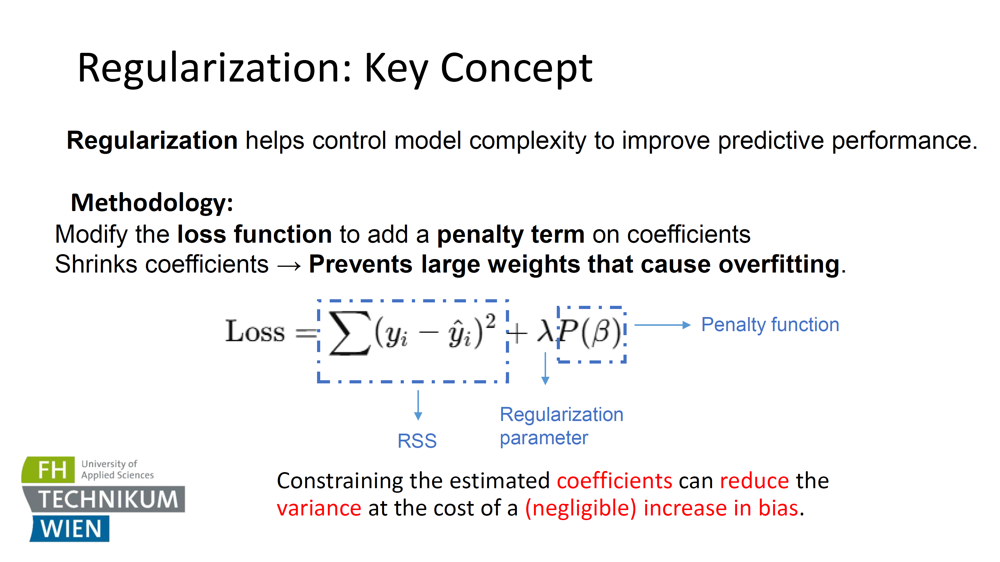

This slide presents the **core mathematical idea behind regularization**.

---

## 🧠 Regularization: Key Concept

The **goal** is to control model complexity — reducing the risk of overfitting — **by penalizing large coefficients** in the model.

---

### ⚙️ Methodology: Modify the Loss Function

In plain linear regression, the loss function is the **Residual Sum of Squares (RSS)**:

$$
\text{Loss} = \sum (y_i - \hat{y}_i)^2
$$

With **regularization**, we **add a penalty term**:

$$
\text{Loss} = \sum (y_i - \hat{y}_i)^2 + \lambda \, P(\boldsymbol{\beta})
$$

* $\lambda$: the **regularization parameter**
  — controls how strong the penalty is
* $P(\boldsymbol{\beta})$: the **penalty function**
  — typically a norm of the coefficient vector

---

### 🧲 Intuition:

* Large weights are **penalized**
* The model prefers **smaller coefficients** unless they **strongly reduce error**
* This **shrinks** the model toward simpler forms

---

### 📉 The Trade-Off:

> 🔵 **Variance decreases**
> 🔴 **Bias increases slightly** (but is usually acceptable)

Hence the line at the bottom:

> **"Constraining coefficients reduces variance at the cost of (negligible) bias."**

This is the core mechanism behind **Ridge** (L2 norm) and **Lasso** (L1 norm) — which we’ll now explore in detail.

Let’s proceed.


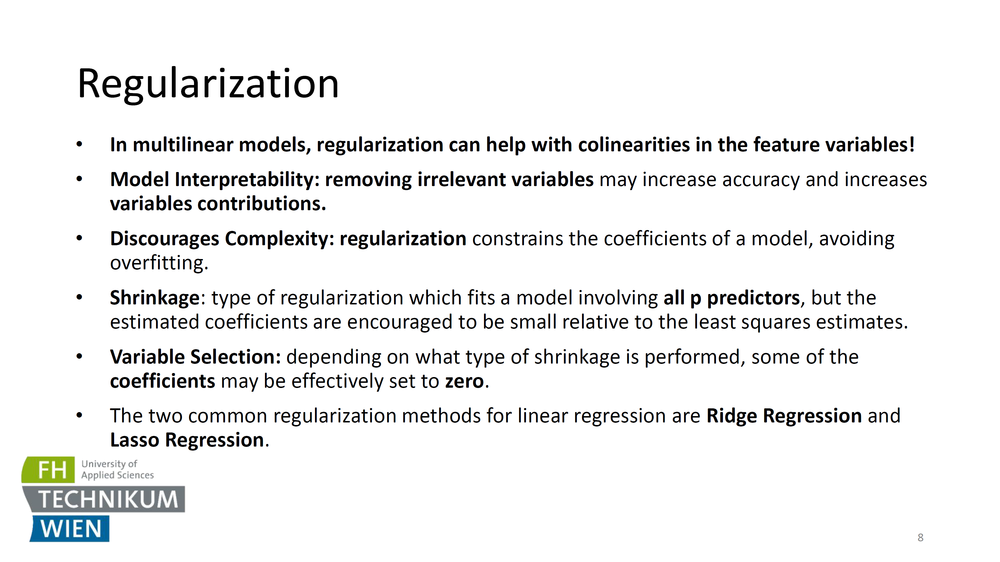

This slide highlights the **practical motivations and benefits of regularization** in regression models.

---

## 🧩 Regularization: Why and When?

Let’s go line by line:

---

### ✅ **Helps with Collinearity**

* When predictor variables are **correlated**, standard regression coefficients become **unstable**.
* Regularization (especially Ridge) helps **stabilize the solution**.

---

### ✅ **Improves Interpretability**

* By **shrinking or removing** irrelevant coefficients, models become **easier to interpret**.
* Especially true for **Lasso**, which can **zero out** variables completely.

---

### ✅ **Discourages Complexity**

* Prevents the model from **fitting noise**.
* Keeps the model within a **controlled complexity range**.

---

### ✅ **Shrinkage**

* A form of regularization where **all variables are included**, but coefficients are **shrunk toward zero**.
* **Ridge** does this — keeping all predictors but with small weights.

---

### ✅ **Variable Selection**

* **Lasso** goes a step further: it can **set some coefficients to exactly zero**.
* This makes it useful for **automatic feature selection** in high-dimensional datasets.

---

### 🔑 Summary

> The two key tools:

* **Ridge Regression**: shrinks but keeps all variables
* **Lasso Regression**: shrinks and may eliminate some variables

These methods are both based on the same principle: **penalize coefficient size**, but they differ in **how** they do it — and that’s exactly what we’ll explore next.

Proceed when ready.


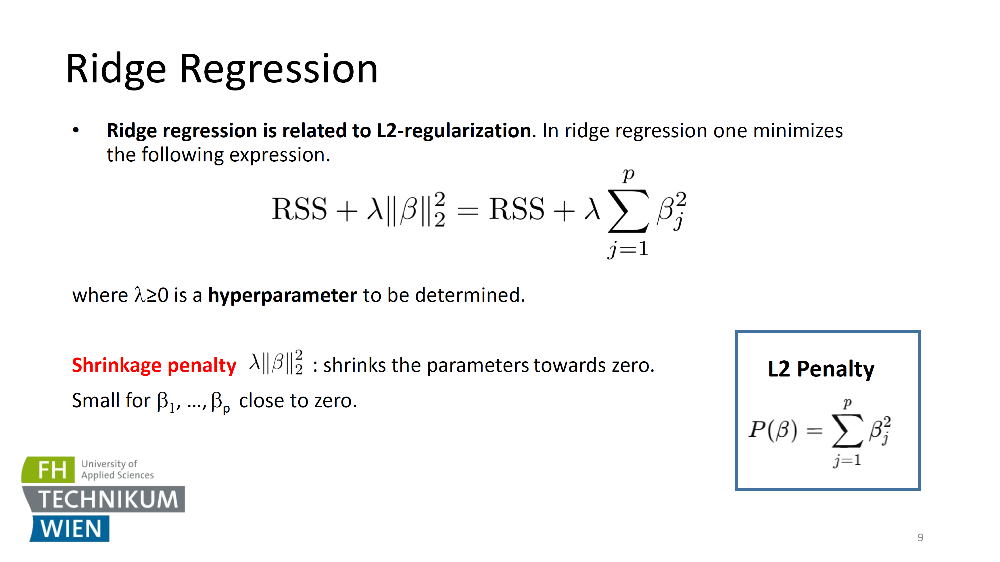

Now we enter the specifics of the **first regularization method**:

---

## 🧮 Ridge Regression

Ridge regression applies what’s called **L2 regularization** — meaning it **penalizes the sum of squared coefficients**.

---

### 🔍 The Loss Function

$$
\text{Loss} = \text{RSS} + \lambda \|\boldsymbol{\beta}\|_2^2 = \sum (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{p} \beta_j^2
$$

* The first part is the **usual least squares error** (RSS).
* The second part is the **L2 penalty**:

  * $\sum \beta_j^2$ → sum of squared model weights.
  * Multiplied by **λ** (lambda), the regularization strength.

---

### 📌 Role of λ (Lambda)

* λ is a **hyperparameter** — it controls how much weight we give to the penalty.

  * **λ = 0** → Ridge regression becomes **ordinary least squares** (no regularization).
  * **λ > 0** → Penalty starts to take effect.
  * **λ → ∞** → All weights are pushed toward **zero**.

---

### 🎯 Why Use Ridge?

> To **shrink** large weights, especially in cases of:

* **Multicollinearity**
* **Many features**
* **High variance models**

---

### 🧠 Takeaway:

Ridge doesn’t eliminate features — it **keeps all predictors** but **shrinks** their influence proportionally.

Coming up: How λ affects the solution — and then the comparison to Lasso. Ready when you are.


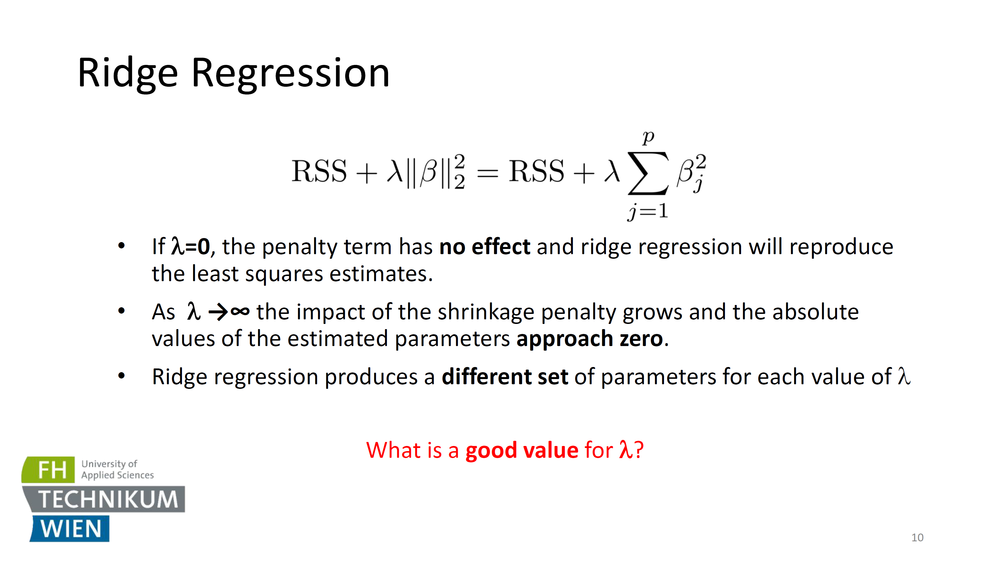

This slide explains how the **hyperparameter λ** affects **Ridge Regression behavior**.

---

## 🔁 Ridge Regression — The Role of λ

Let’s revisit the formula:

$$
\text{Loss} = \text{RSS} + \lambda \sum_{j=1}^p \beta_j^2
$$

Now we look at **what happens as λ changes**:

---

### 🟢 λ = 0

* No regularization.
* The model behaves exactly like **Ordinary Least Squares**.
* No shrinkage at all — **pure variance minimization** on the training set.

---

### 🔴 λ → ∞

* The penalty term **dominates** the loss.
* All coefficients $\beta_j$ are driven **closer to zero**.
* Eventually, the model becomes the **null model** (predicts a constant for all inputs).

---

### 🔁 Each λ yields a different solution

* Ridge regression gives a **continuum of models**, one for each λ.
* Choosing the **right λ** is crucial — and leads to the red question at the bottom:

> 🔍 **What is a good value for λ?**

We typically **tune λ** using:

* **Cross-validation**: train on subsets, test on held-out data
* Select λ that minimizes **validation error**

The next slides will illustrate this visually.

Ready?


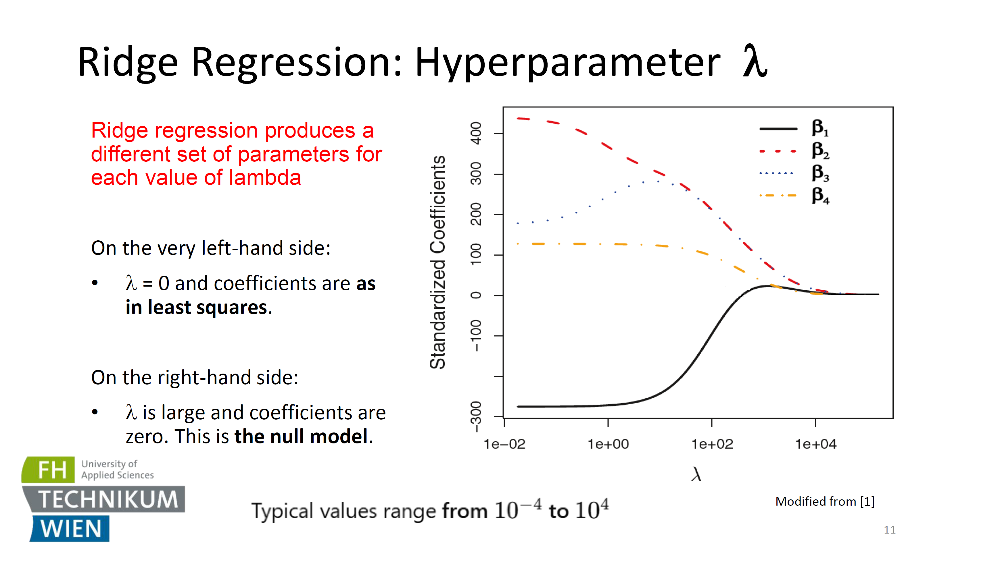

This slide **visualizes** the effect of λ on the **Ridge regression coefficients**.

---

## 📈 Ridge Regression: Hyperparameter λ

As mentioned before, **each λ gives a different set of coefficients**. This graph illustrates that.

---

### 🟦 Plot Explanation (Right Side)

* **X-axis**: λ (on a logarithmic scale, from $10^{-2}$ to $10^{4}$)
* **Y-axis**: Standardized coefficient values for β₁, β₂, β₃, β₄

---

### 🔍 Observations:

* On the **left-hand side** (small λ ≈ 0):

  * All coefficients match **least squares estimates** — no penalty.
* Moving to the **right**:

  * As λ increases, **all coefficients shrink** gradually.
  * Eventually, all approach **zero** — the **null model**.

This shrinking is **smooth and continuous** — a key property of **L2 regularization**.

---

### 💡 Note:

* Ridge **never eliminates** coefficients completely — it **dampens them**.
* Contrast this with **Lasso**, which can actually **set some β exactly to zero**.

---

### ℹ️ Final Remark:

> Typical λ values for tuning lie between $10^{-4}$ and $10^4$, selected via **cross-validation**.

We’ll now wrap up Ridge and transition into **Lasso Regression**, where things behave differently.

Ready for the next.


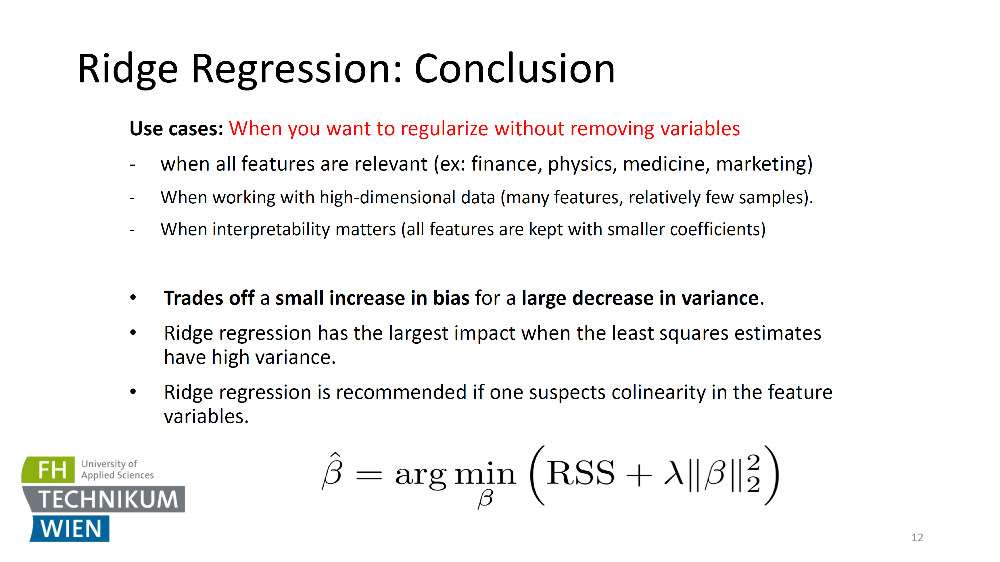

This slide summarizes the key takeaways for **Ridge Regression**.

---

## 🏁 Ridge Regression: Conclusion

### ✅ **Use Cases — When to Use Ridge**

> "When you want to regularize **without removing** any variables"

Ideal when:

* **All features are believed to be useful**

  * Examples: **finance**, **physics**, **medicine**, **marketing**
* You're dealing with **high-dimensional data**

  * e.g., many features, but few samples
* **Interpretability matters**

  * Ridge keeps all features — just **with smaller, stabilized coefficients**

---

### 🔁 **What Ridge Offers**

* **Shrinks all coefficients**, but never sets them exactly to zero
* **Greatly reduces variance**, at the cost of a **small increase in bias**
* Very effective in the presence of **multicollinearity**

---

### 🧠 Mathematical Form:

$$
\hat{\boldsymbol{\beta}} = \arg\min_{\boldsymbol{\beta}} \left( \text{RSS} + \lambda \|\boldsymbol{\beta}\|_2^2 \right)
$$

This highlights:

* The **minimization goal**
* The **balance between fit and penalty**

---

### 🧭 Bottom Line:

Use Ridge when you want a **stable**, **generalizable**, and **interpretable** model without discarding features.

Now let’s switch gears and explore **Lasso Regression**, where variable selection comes into play.

Ready when you are.


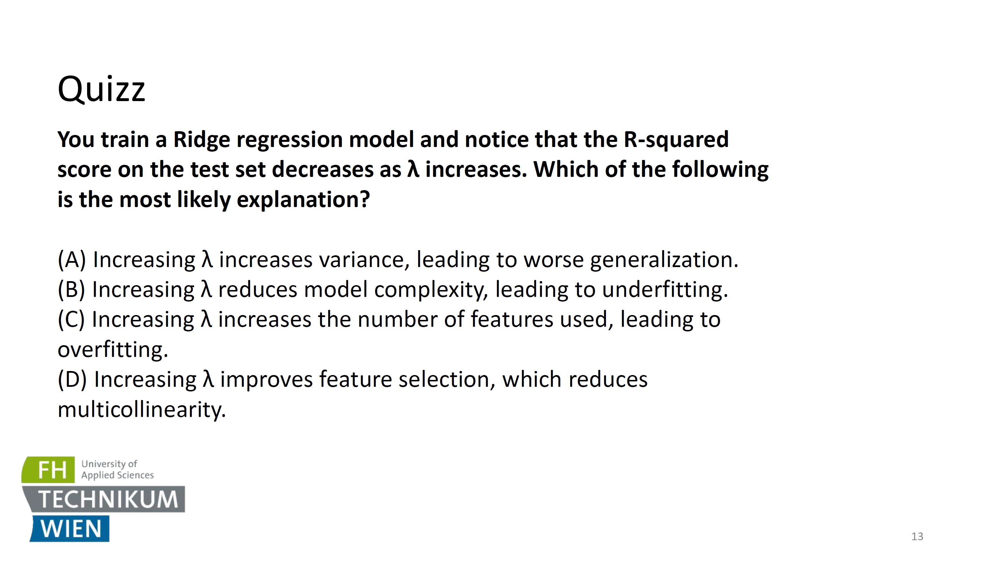

This is a quick quiz slide to **test your understanding** of Ridge regression and the role of **λ**.

---

### ❓ Question Recap:

> *You train a Ridge regression model and notice that the R² score on the test set **decreases** as λ **increases**. What’s the most likely explanation?*

Let’s go through the choices:

---

#### (A) Increasing λ **increases variance**, leading to worse generalization

❌ **Incorrect** — Increasing λ **reduces variance** (not increases). It’s one of the key purposes of regularization.

---

#### (B) Increasing λ **reduces model complexity**, leading to **underfitting**

✅ **Correct** — As λ becomes too large, the model becomes too simple (shrinks coefficients too much), leading to **underfitting** and worse performance.

---

#### (C) Increasing λ **increases the number of features** used, leading to overfitting

❌ **Incorrect** — Ridge **never adds** features or causes overfitting as λ increases. It **shrinks all coefficients** regardless of feature count.

---

#### (D) Increasing λ **improves feature selection**, which reduces multicollinearity

❌ **Incorrect** — Ridge doesn’t perform feature selection (that’s **Lasso’s job**). It addresses multicollinearity, yes — but **not via feature elimination**.

---

### ✅ Final Answer: **(B)**

> Increasing λ reduces model complexity, and too much reduction leads to **underfitting**, hence lower R².

Shall we continue with Lasso?


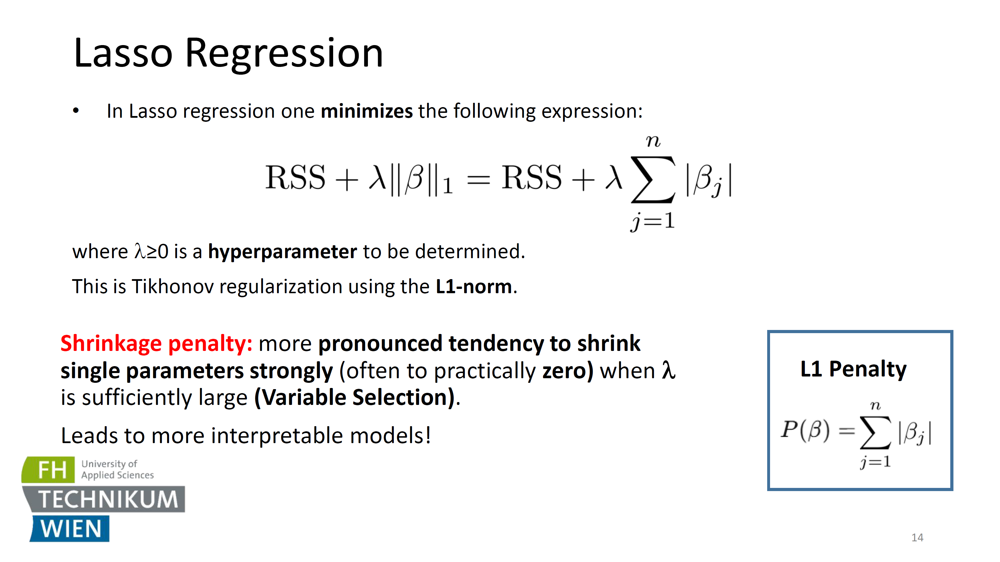

Now we move on to the second major regularization method:

---

## 🧲 Lasso Regression — L1 Regularization

Lasso stands for **Least Absolute Shrinkage and Selection Operator**. It uses the **L1 norm** to penalize model complexity.

---

### 🔍 Loss Function:

$$
\text{Loss} = \text{RSS} + \lambda \|\boldsymbol{\beta}\|_1 = \sum (y_i - \hat{y}_i)^2 + \lambda \sum_{j=1}^{n} |\beta_j|
$$

* $\lambda$: regularization strength (as in Ridge)
* $\|\boldsymbol{\beta}\|_1$: sum of absolute values of coefficients — the **L1 penalty**

---

### 🚨 Key Difference from Ridge:

* Ridge (**L2**) → sum of squares of $\beta_j$
* **Lasso (**L1**)** → sum of **absolute values** of $\beta_j$

---

### 📉 Shrinkage Behavior:

* Lasso **strongly penalizes** large individual coefficients
* It has the **unique ability to set some coefficients exactly to zero**
* This results in **automatic variable selection** (only the most relevant features stay)

---

### ✅ Benefits:

* Results in **sparser models**
* **More interpretable**
* Especially useful when we believe **only a subset of features are actually relevant**

---

### 🧠 Summary:

> Ridge = shrinkage
> Lasso = shrinkage **+ selection**

More on how λ affects Lasso in the next slides.

Ready to proceed?


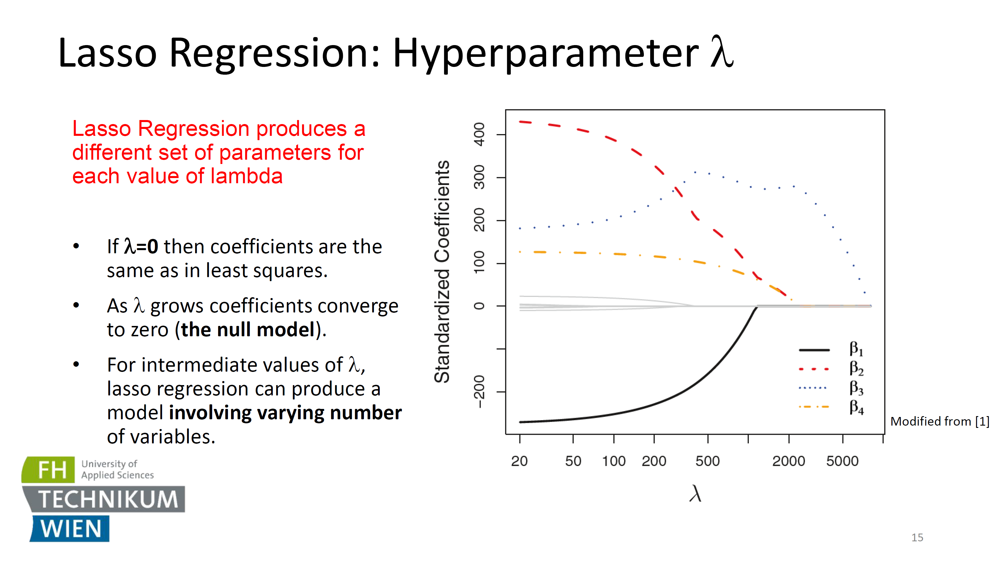

This slide visualizes how **λ affects Lasso regression coefficients**, and how **feature selection emerges**.

---

## 📈 Lasso Regression: Hyperparameter λ

As with Ridge, each λ gives a different solution — but here the behavior is quite different:

---

### 🔍 Plot Overview (Right Side)

* **X-axis**: λ (log scale, from 20 to 5000)
* **Y-axis**: Standardized coefficients for several features (β₁, β₂, …)
* As λ increases, **some coefficients abruptly drop to zero**.

---

### 🧠 Key Properties of Lasso

* **λ = 0**: Ordinary Least Squares (no penalty), all coefficients included
* **λ → ∞**: All coefficients go to 0 — the **null model**
* **Intermediate λ**: Some coefficients remain; others are **set to zero**
  → This is **automatic feature selection**

---

### 🟢 Important Difference from Ridge:

* Ridge: All coefficients shrink gradually, none go exactly to zero
* Lasso: Some coefficients shrink **to zero abruptly** — effectively **removing features**

This gives Lasso its **sparsity property**, which is critical in high-dimensional datasets where many features may be irrelevant.

---

### 🧠 Summary Line:

> Lasso regression can create **simpler models with fewer variables** as λ increases.

More λ → more sparsity → fewer features → higher interpretability (but risk of underfitting)

We’ll now go deeper into how shrinkage differs between L1 and L2.

Shall we continue?


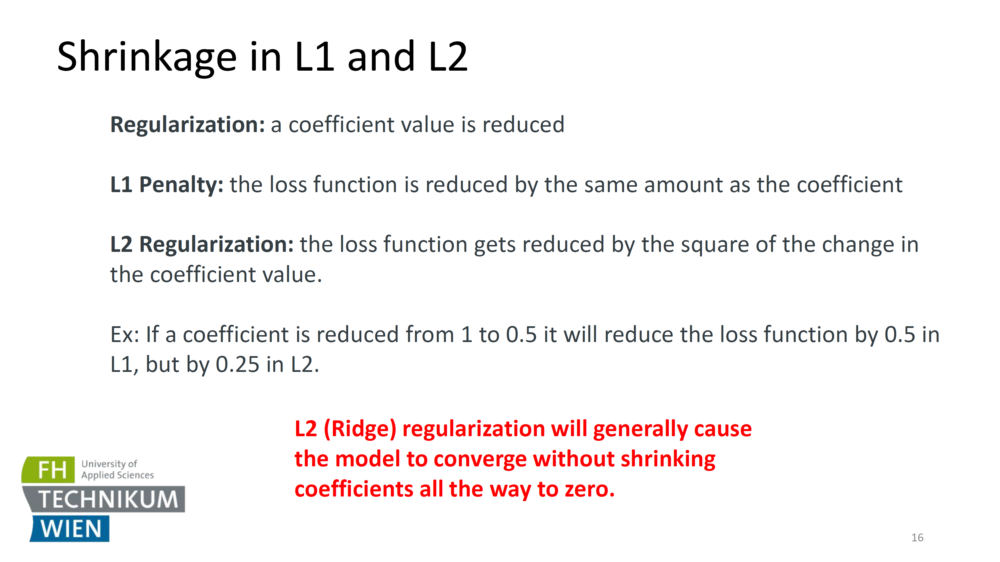

This slide offers a **technical comparison of how shrinkage behaves under L1 and L2 penalties** — explaining why Lasso leads to sparsity, and Ridge does not.

---

## 🧠 Shrinkage in L1 vs. L2

### 🔧 Regularization, in general:

> Means **reducing the size of the coefficients** to prevent overfitting.

---

### 📉 L1 Penalty (Lasso):

* The penalty is **proportional to the absolute value** of the coefficient:

  $$
  \sum |\beta_j|
  $$
* This creates a **constant gradient**, leading to a strong pull towards zero.
* Coefficients are **shrunk equally**, and often **set exactly to zero** — enabling **feature selection**.

---

### 📉 L2 Penalty (Ridge):

* The penalty is **proportional to the square** of the coefficient:

  $$
  \sum \beta_j^2
  $$
* This results in **smaller gradients** as coefficients get smaller.
* Coefficients are shrunk **progressively less** as they get closer to zero.
* Ridge thus **rarely sets coefficients to exactly zero** — it **shrinks**, but doesn’t **eliminate**.

---

### 💡 Numerical Example:

* If a coefficient drops from 1 → 0.5:

  * **L1 penalty** drops by **0.5**
  * **L2 penalty** drops by **0.25**

This is why **L1 is more aggressive** in eliminating features.

---

### 🔴 Key Conclusion:

> "**L2 (Ridge) regularization will generally cause the model to converge without shrinking coefficients all the way to zero.**"

Which is why:

* **Ridge** is great for **stabilization**
* **Lasso** is great for **simplification**

We’ll soon see use cases and a summary next.

Ready?


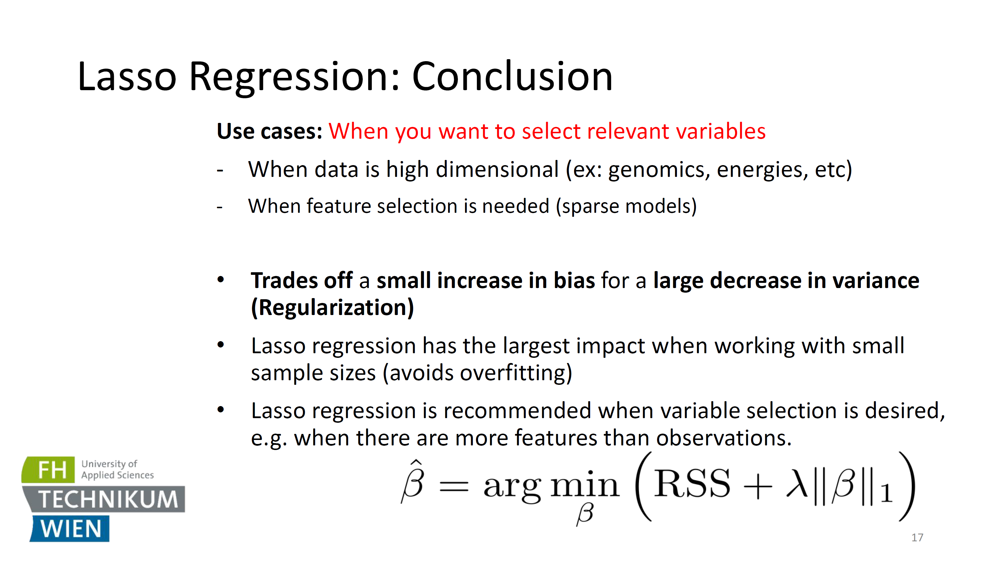

This slide wraps up **Lasso Regression** with its **ideal use cases**, trade-offs, and optimization formula.

---

## ✅ Lasso Regression: Conclusion

### 🔍 Use Cases — When Lasso Is a Good Choice:

> “**When you want to select relevant variables**”

* **High-dimensional data**: more features than samples
  e.g., genomics, energy data, text analysis
* **Feature selection** is important → Lasso can **drop irrelevant variables**, creating **sparse models**

---

### ⚖️ Regularization Trade-Off

* Accepts a **small increase in bias**
* Gains a **large reduction in variance**
* Improves **generalization** and prevents **overfitting**

---

### 📏 Greatest Impact When:

* The dataset has **few observations** but **many features**
* Example: You have 50 samples and 1,000 predictors → Lasso can shrink 950+ of them to zero

---

### 🧮 Optimization Objective:

$$
\hat{\boldsymbol{\beta}} = \arg\min_{\boldsymbol{\beta}} \left( \text{RSS} + \lambda \|\boldsymbol{\beta}\|_1 \right)
$$

* The L1 norm enables **automatic variable selection**
* λ controls **how many variables are kept**

---

### 🟢 Summary:

> Use Lasso when you want a **simpler, interpretable, and sparse model**, and you suspect **only a few features truly matter**.

Shall we continue with the Lasso quiz?


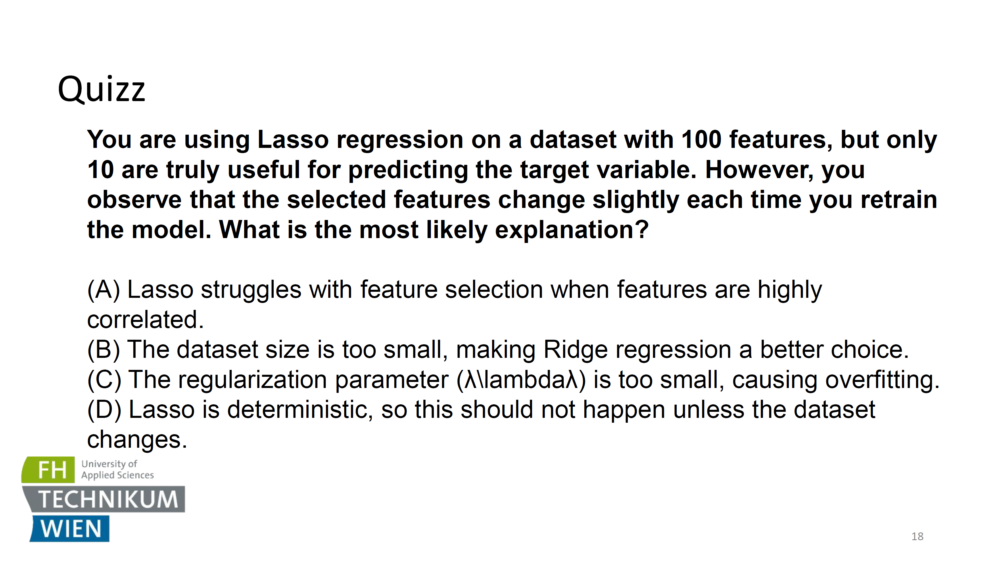

This quiz tests your understanding of **Lasso’s feature selection behavior**, especially in high-dimensional settings.

---

## ❓ Question Recap:

> *You're using Lasso on a dataset with 100 features, only 10 of which are truly relevant.
> Each retraining gives a slightly different subset of selected features.
> Why is that happening?*

---

Let’s evaluate the options:

---

### (A) **Lasso struggles with feature selection when features are highly correlated.**

✅ **Correct** — Lasso has difficulty deciding **which feature to keep** when multiple features are **strongly correlated**.
It may **arbitrarily drop one** and keep the other, leading to **instability** across runs.
This is a well-known limitation of Lasso.

---

### (B) The dataset size is too small, making Ridge regression a better choice.

❌ **Incorrect** — Lasso is often **preferred** for small datasets with many features, since it can eliminate irrelevant ones.
Ridge doesn’t do variable selection.

---

### (C) The regularization parameter is too small, causing overfitting.

❌ **Unlikely** — If λ were too small, Lasso would act like plain linear regression, yes — but the instability described is more typical of **correlated predictors**, not λ issues per se.

---

### (D) Lasso is deterministic, so this should not happen unless the dataset changes.

❌ **Incorrect** — Even with the same dataset, randomness (e.g. initialization, solver tolerances) or **correlated variables** can make Lasso select **different subsets**.

---

## ✅ Final Answer: **(A)**

> Lasso struggles with feature selection when features are **highly correlated**, causing **instability in the selected subset**.

Let me know when to proceed.


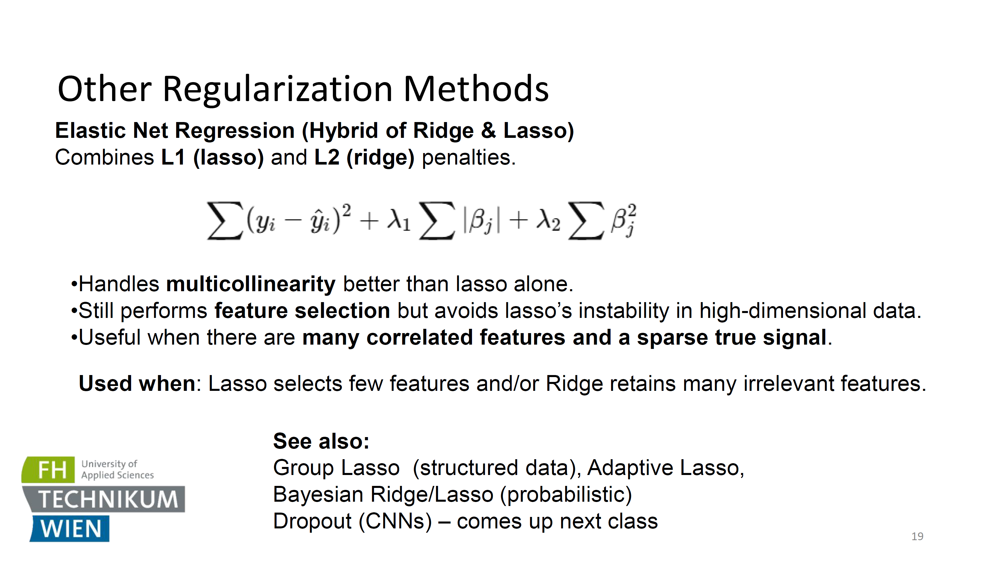

This slide introduces **other regularization methods**, with a focus on **Elastic Net Regression**, a powerful hybrid approach.

---

## 🔗 Elastic Net Regression

> A **blend of Ridge (L2)** and **Lasso (L1)** penalties:

$$
\sum (y_i - \hat{y}_i)^2 + \lambda_1 \sum |\beta_j| + \lambda_2 \sum \beta_j^2
$$

It combines:

* **L1 penalty** → drives coefficients to **zero** (like Lasso)
* **L2 penalty** → handles **multicollinearity** and stabilizes coefficients (like Ridge)

---

### 🧠 Why Use Elastic Net?

#### ✅ Handles **correlated predictors** better than Lasso

* Lasso can drop features **arbitrarily** when predictors are highly correlated.
* Elastic Net **shares weight** among them — stabilizing the selection.

#### ✅ Still supports **feature selection**

* Because of the L1 component

#### ✅ Ideal for:

* **High-dimensional data**
* Where you expect:

  * Many predictors
  * Only a few are truly relevant (**sparse true signal**)

---

### 🔁 When to Prefer It:

> When:

* Lasso drops **too many** features
* Ridge retains **too many irrelevant** features

Elastic Net provides a **middle ground**.

---

### 📚 Also Worth Exploring:

* **Group Lasso**: For structured feature groups
* **Adaptive Lasso**: Weighted penalties
* **Bayesian Ridge/Lasso**: Probabilistic approaches
* **Dropout (CNNs)**: A kind of regularization in deep learning — coming up next session

Shall we continue with λ selection and model comparison?


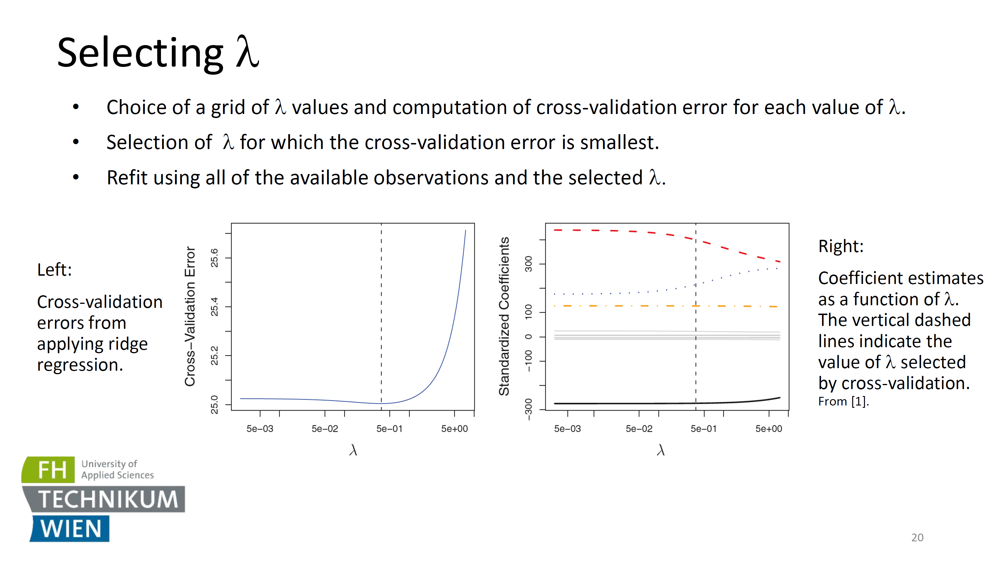

This slide explains **how to select the optimal λ** — the key hyperparameter in regularization.

---

## 🎯 Selecting λ (Lambda)

### 🔧 Step-by-Step Procedure:

1. **Choose a grid of λ values**

   * e.g. logarithmic scale: $\lambda \in [10^{-4}, 10^4]$
2. **Perform cross-validation**

   * For each λ: train on training folds, validate on the hold-out fold
3. **Pick the λ with the lowest validation error**
4. **Refit** the model using **all the data** and the selected λ

---

### 📊 Left Plot:

* **X-axis**: λ values (log scale)
* **Y-axis**: Cross-validation error
* **U-shaped curve**:

  * Small λ: overfitting → high variance
  * Large λ: underfitting → high bias
  * **Minimum** → ideal λ
* **Dashed vertical line** shows the λ selected

---

### 📈 Right Plot:

* Tracks **coefficient paths** as λ changes
* Vertical dashed line = selected λ
* You can see which coefficients remain active and how much shrinkage occurs

---

### ✅ Summary:

> Use **cross-validation** to find the λ that balances bias and variance for best generalization.

This approach applies to **Ridge**, **Lasso**, and **Elastic Net** alike.

Shall we go to the comparison summary?


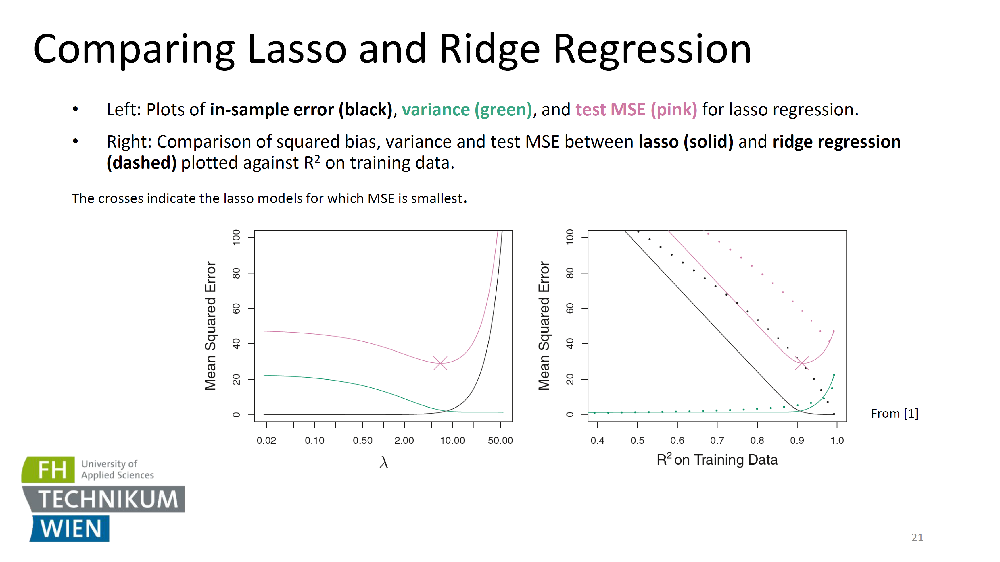

This slide provides a **side-by-side performance comparison** between **Lasso** and **Ridge Regression**, using error metrics and $R^2$ values.

---

## ⚖️ Comparing Lasso and Ridge

---

### 📊 Left Plot: Lasso Regression Performance vs. λ

* **X-axis**: λ (log scale)
* **Y-axis**: Mean Squared Error (MSE)

**Curves:**

* **Black** → In-sample error
* **Green** → Variance
* **Pink** → Test MSE

**Cross mark**: λ where **Lasso** achieves its **lowest test MSE**

🧠 **Interpretation**:

* Low λ → high variance (overfit)
* High λ → high bias (underfit)
* Sweet spot: balanced bias-variance tradeoff = lowest test MSE

---

### 📊 Right Plot: Lasso vs. Ridge Comparison

* **X-axis**: $R^2$ on training data (i.e., goodness of fit)
* **Y-axis**: Mean Squared Error (MSE)

**Line styles:**

* **Solid** → Lasso
* **Dashed** → Ridge

You can compare:

* **Bias (black)**,
* **Variance (green)**,
* **Test error (pink)**

🧠 **Key Takeaways**:

* **Lasso** reaches minimum test error at higher $R^2$ than Ridge
* **Ridge** may generalize better in some cases (especially with correlated features)
* **Lasso** can have more variance in selection, but achieves sparsity

---

### ❌ Pitfall:

* If over-tuned, both can **underfit or overfit**, as seen in the curve edges

---

## ✅ Bottom Line:

> **Use cross-validation** to decide not just **λ**, but also **which method (Lasso or Ridge)** performs better on your data.

Final summary slide coming next?


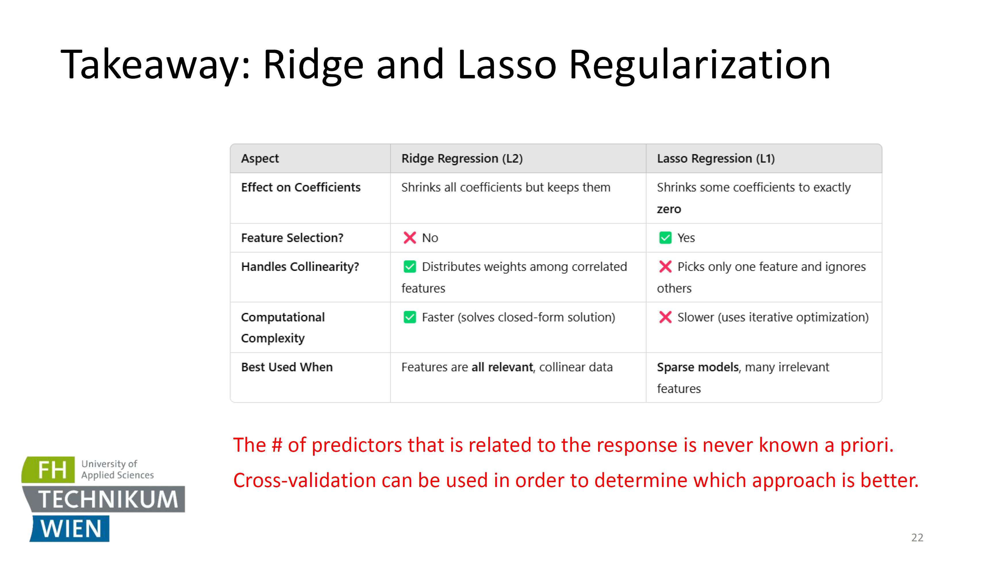

This final content slide offers a **comprehensive summary** comparing **Ridge** and **Lasso** — and when to use which.

---

## 🧾 Takeaway: Ridge vs. Lasso Regularization

| **Aspect**                   | **Ridge (L2)**                                       | **Lasso (L1)**                             |
| ---------------------------- | ---------------------------------------------------- | ------------------------------------------ |
| **Effect on Coefficients**   | Shrinks all, **none go to zero**                     | Shrinks **some to exactly zero**           |
| **Feature Selection?**       | ❌ No                                                 | ✅ Yes (automatic variable selection)       |
| **Handles Collinearity?**    | ✅ Yes (distributes weight among correlated features) | ❌ Picks one, ignores others                |
| **Computational Complexity** | ✅ Faster (closed-form solution)                      | ❌ Slower (requires iterative optimization) |
| **Best Used When**           | All features are likely **relevant**, or collinear   | Many features, but most are **irrelevant** |

---

### 🔴 Final Notes:

* **You never know in advance** how many features are truly relevant.
* So you should always use **cross-validation** to choose:

  * the **method** (Ridge or Lasso)
  * the **value of λ** (the regularization strength)

---

### 🧠 Bottom Line:

> Ridge = Keep all, stabilize
> Lasso = Select few, simplify

Use data-driven validation to decide which works best for your case.

We’re done with the core slides — would you like to continue with the quiz and assignment slide?


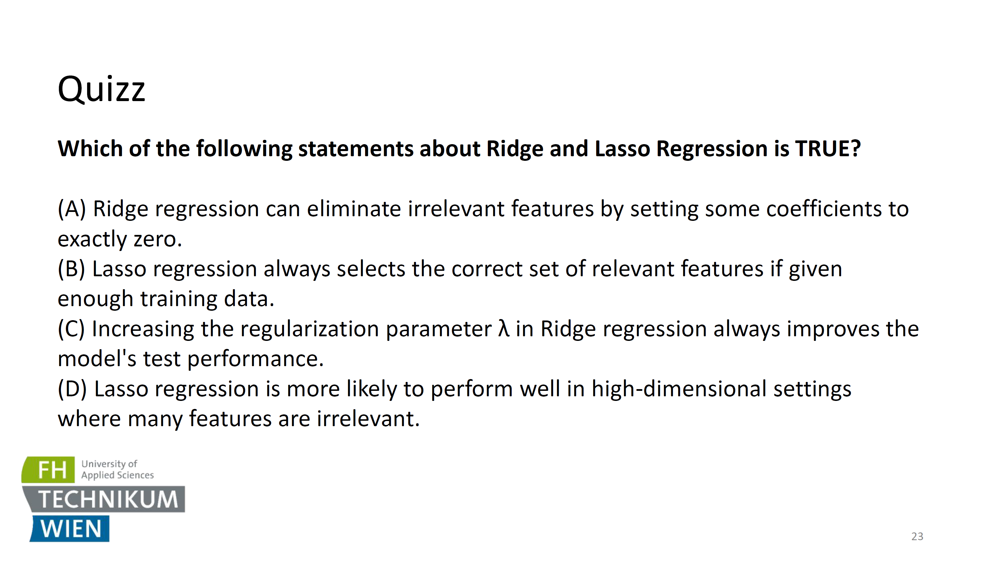

This final quiz checks if you've internalized the core differences between **Ridge** and **Lasso** regression.

---

## ❓ Question Recap:

> *Which of the following statements about Ridge and Lasso Regression is **TRUE**?*

---

### (A) **Ridge regression can eliminate irrelevant features by setting some coefficients to exactly zero.**

❌ **False** — Ridge (L2) **shrinks**, but **never zeroes out** coefficients.

---

### (B) **Lasso regression always selects the correct set of relevant features if given enough training data.**

❌ **False** — Lasso **can fail** in presence of **highly correlated features** or **small signal-to-noise ratio**.
It's not guaranteed to recover the true model even with more data.

---

### (C) **Increasing the regularization parameter λ in Ridge regression always improves the model's test performance.**

❌ **False** — Increasing λ **too much** causes **underfitting**, which hurts performance. There's an **optimal λ**, not "the higher the better."

---

### (D) **Lasso regression is more likely to perform well in high-dimensional settings where many features are irrelevant.**

✅ **True** — Lasso is **designed for sparsity**. It does **feature selection**, and works best when only **a few features matter** — which is common in **high-dimensional** problems.

---

## ✅ Correct Answer: **(D)**

Let me know if you'd like to continue with the assignment slide or wrap up.


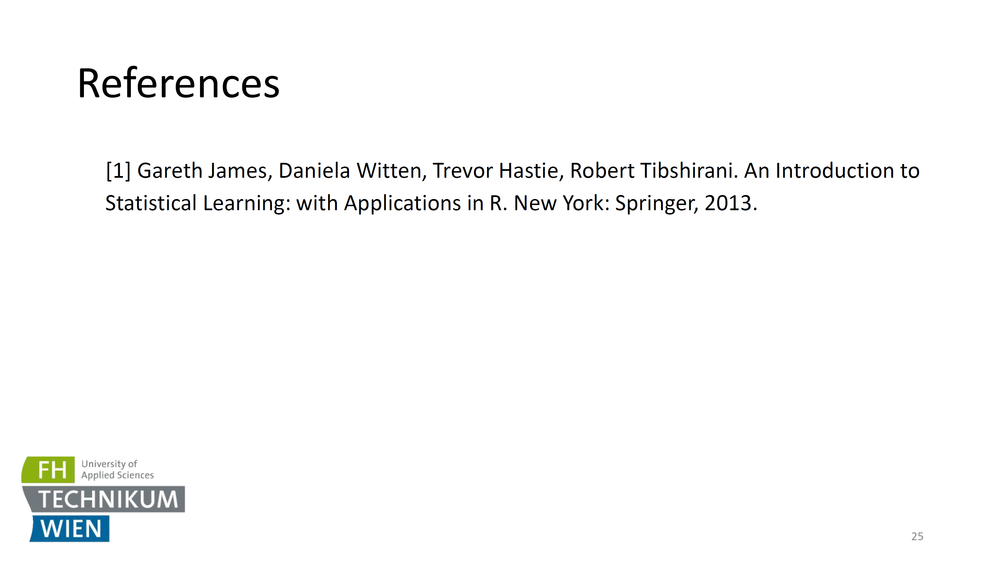

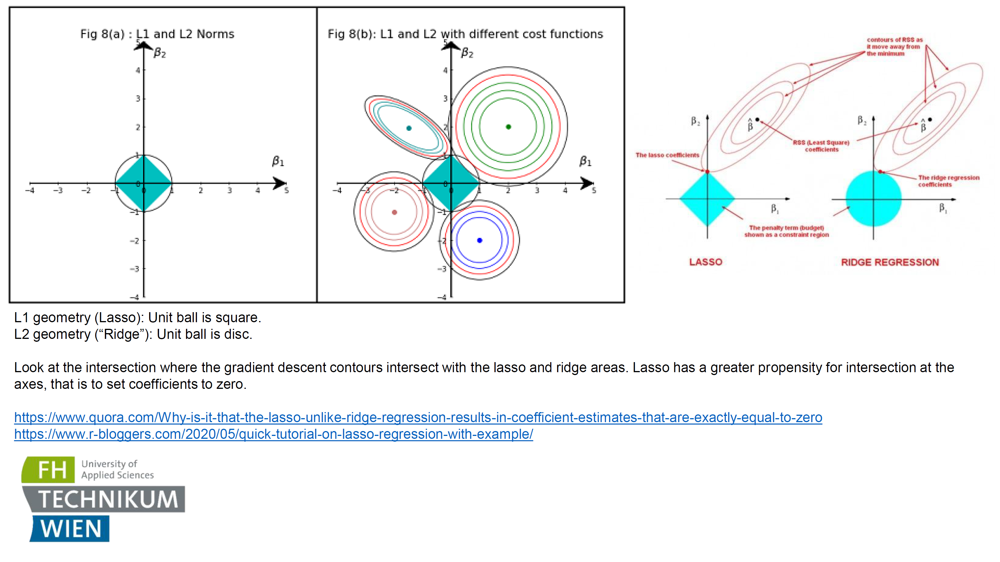